In [34]:
%load_ext autoreload
%autoreload 2

import sys
sys.path.append("../../src/")

import os
import pandas as pd
import numpy as np
import random
from eda.utils_plot import get_upack_patch, save2pdf, visualize_col_data
from eda.general_eda import general_stats, general_eda_main

The autoreload extension is already loaded. To reload it, use:
  %reload_ext autoreload


# Stats computation & analysis of AI4boundaries dataset


In [2]:
SENTINEL2_DIR = "ai4boundaries_dataset"

## Sweden (SE)

In [59]:
country = "SE"

#### General EDA for the country

General information: 
           n_fields   prc_fields  sm_area_cnt  bg_area_cnt  sm_solidity_cnt  \
count  1420.000000  1420.000000  1420.000000  1420.000000      1420.000000   
mean     69.382394    31.048310     8.448592     0.643662         0.028873   
std      60.009075    25.130446     8.710004     1.242225         0.175722   
min       0.000000     0.000000     0.000000     0.000000         0.000000   
25%      18.000000     8.500000     2.000000     0.000000         0.000000   
50%      58.000000    26.500000     6.000000     0.000000         0.000000   
75%     105.000000    49.625000    12.000000     1.000000         0.000000   
max     308.000000    97.900000    64.000000     9.000000         2.000000   

       bg_solidity_cnt  sm_eccentricity_cnt      area_min     area_mean  \
count      1420.000000          1420.000000   1299.000000   1299.000000   
mean         37.626761             0.339437    177.230947    569.896475   
std          35.614154             0.662278   137

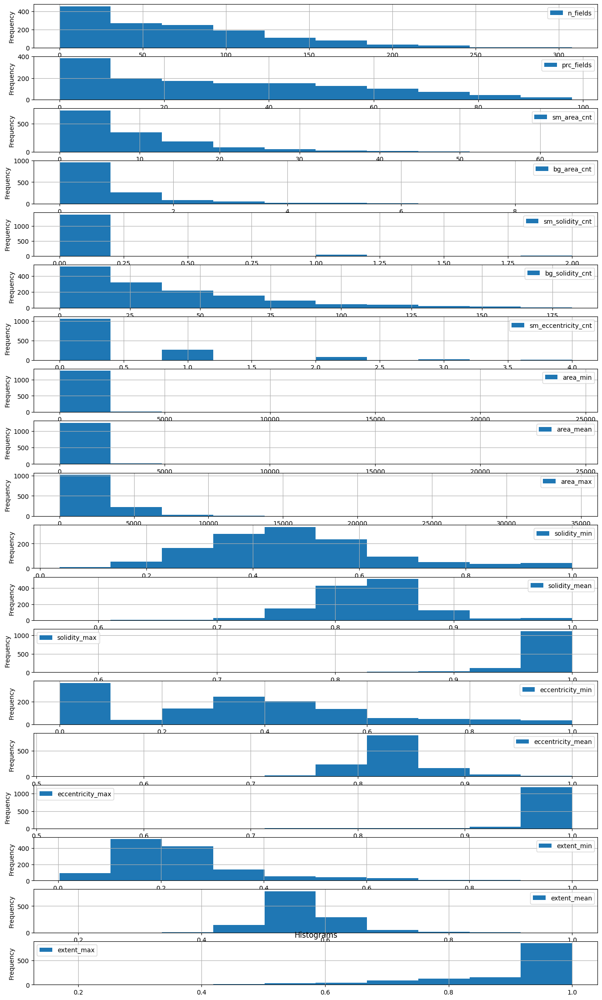

Total number of fields 0.1 M
Total area of fields in ha 28.89 M
Number of patches without fields present 121 (8.52%)
Number of patches with small percentage  (< 10) of fields present 265 (18.66%)
Number of patches with small number (< 40) of fields present 400 (28.17%)
Number of patches with small number or small percentage of fields present combined 418 (29.44%)
Number of patches with small number & small percentage of fields present combined 247 (17.39%)
Number of patches with n_fields (>= 189.4) of fields present 67 (4.72%)
Number of patches with prc_fields (>= 75.0) of fields present 81 (5.7%)
Number of patches with prc_fields (< 25.0) of fields present 675 (47.54%)
Number of patches with sm_area_cnt (>= 25.87) of fields present 75 (5.28%)
Number of patches with bg_area_cnt (>= 3.13) of fields present 58 (4.08%)
Number of patches with sm_solidity_cnt (>= 0.38) of fields present 39 (2.75%)
Number of patches with bg_solidity_cnt (>= 108.86) of fields present 83 (5.85%)
Number of patc

In [60]:
data = general_eda_main(SENTINEL2_DIR, country,
                     sm_prc_fields=10, sm_num_fields=40)

### Visualizations of the country data

In [ ]:
# visualize the data with no fields
visualize_col_data(data, SENTINEL2_DIR, country=country, col='no_field', num_img=2,
                       num_plots=2) # no intereset -> mountain regions

In [ ]:
# visualize the data with small number of fields (<40)
visualize_col_data(data, SENTINEL2_DIR, country=country, col='sm_num_fields', num_img=2,
                       num_plots=2) # isolated fields in the mountains, forest, ...

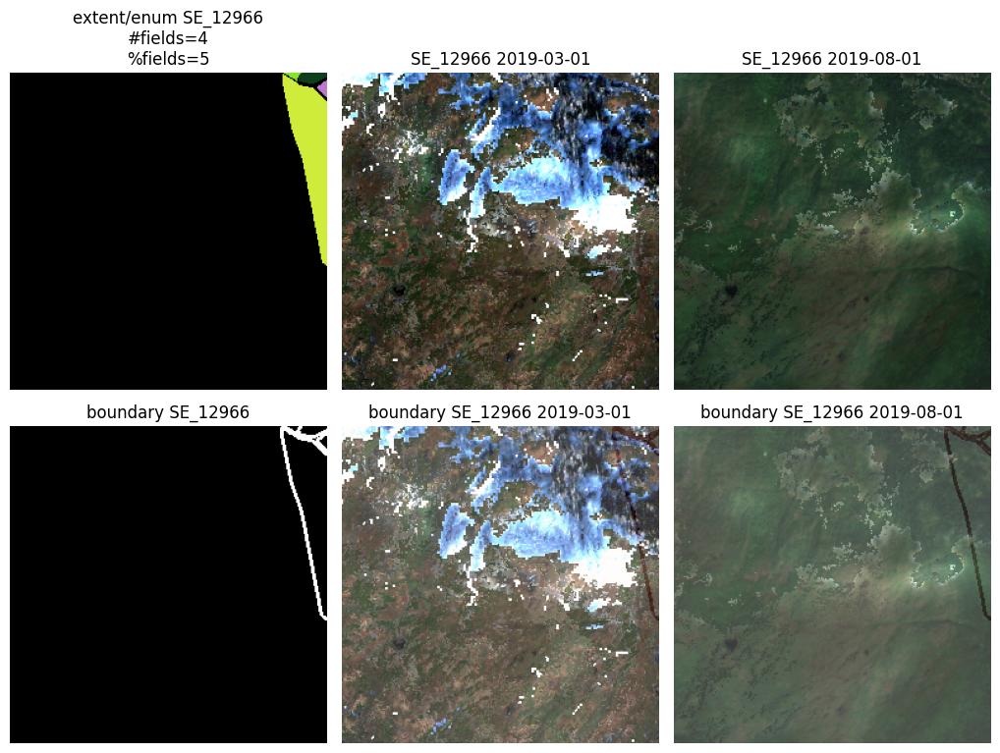

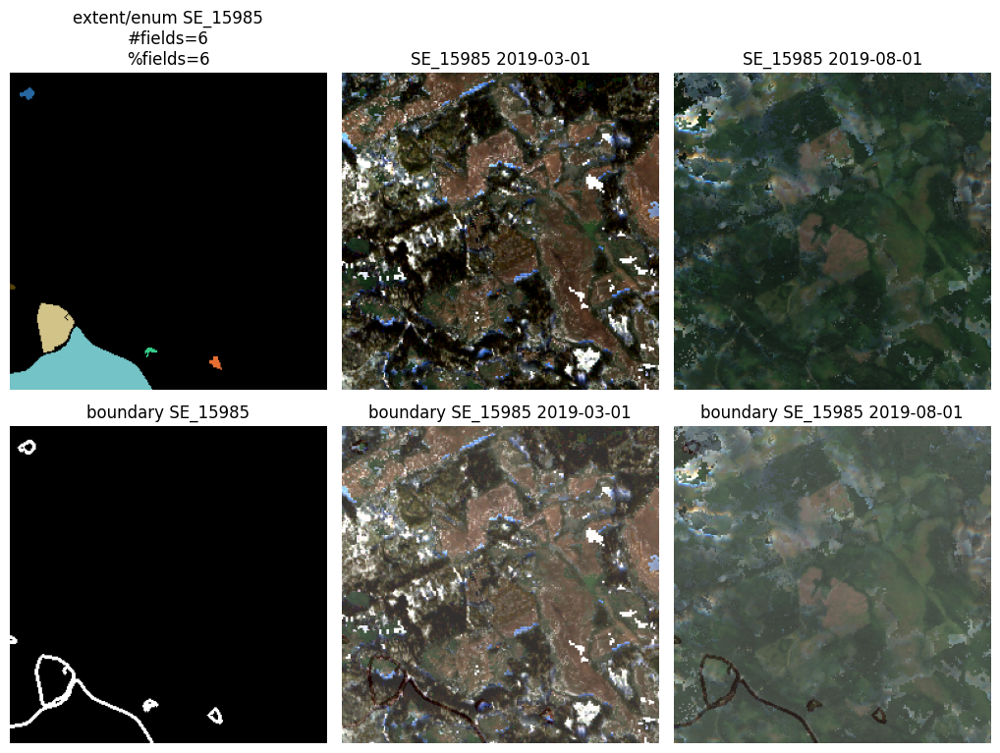

In [87]:
# visualize the data with small % of fields (<10%)
visualize_col_data(data, SENTINEL2_DIR, country=country, col='sm_prc_fields', num_img=2,
                       num_plots=2)

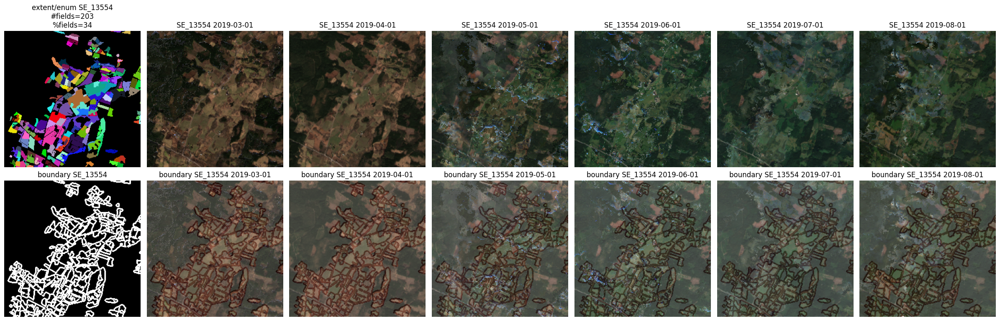

In [71]:
# visualze patches with a lot of fields present
# Number of patches with n_fields (>= 189.4) of fields present 67 (4.72%)
visualize_col_data(data, SENTINEL2_DIR, country=country, col='n_fields_gt', num_img=6,
                       num_plots=1)

In [ ]:
# visualze patches with a lot of fields present
# Number of patches with n_fields (>= 189.4) of fields present 67 (4.72%)
visualize_col_data(data, SENTINEL2_DIR, country=country, col='n_fields_gt', num_img=1,
                       num_plots=2) # no interest as in 'prc_fields_gt' vis

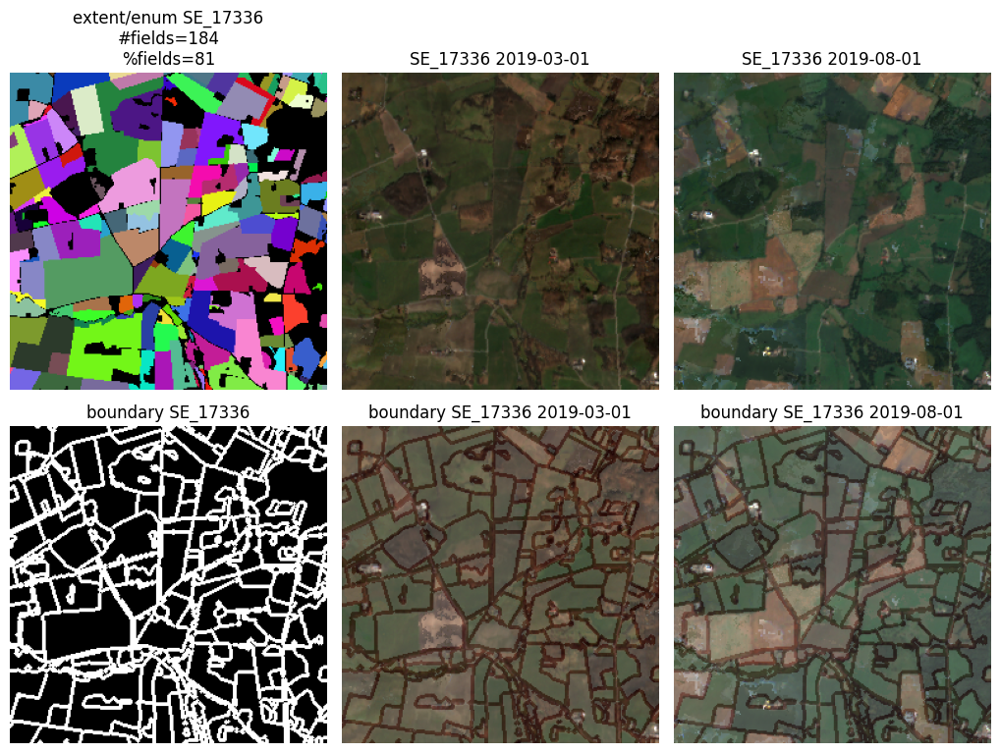

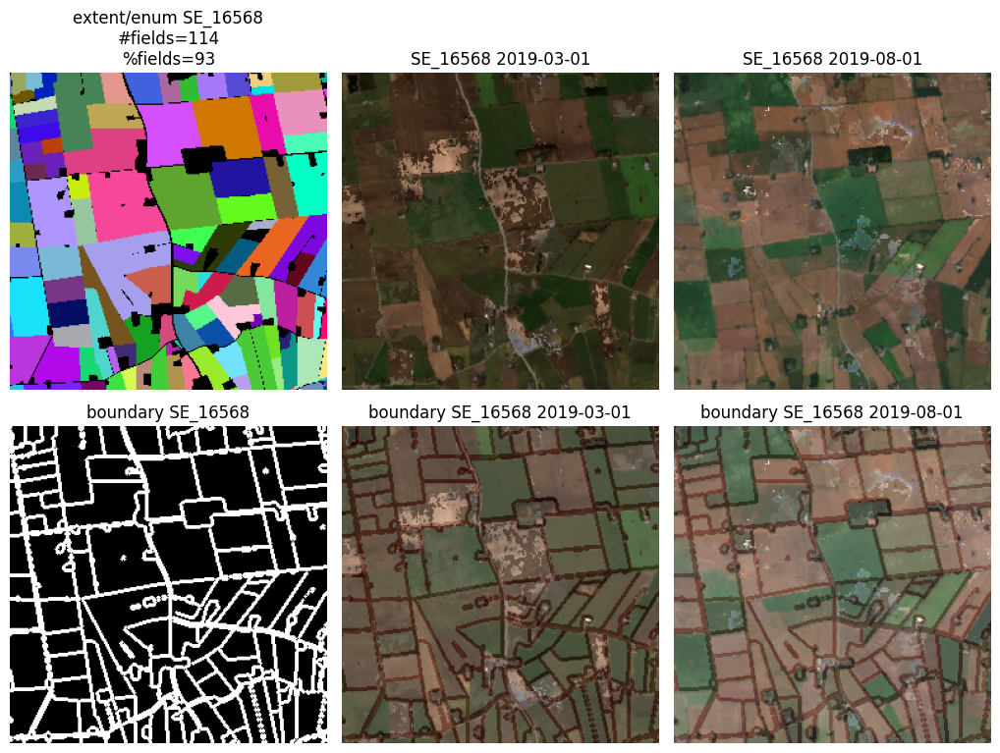

In [74]:
# visualze patches with a lot of % fields present
# Number of patches with prc_fields (>= 75.0) of fields present 81 (5.7%)
visualize_col_data(data, SENTINEL2_DIR, country=country, col='prc_fields_gt', num_img=2,
                       num_plots=2)

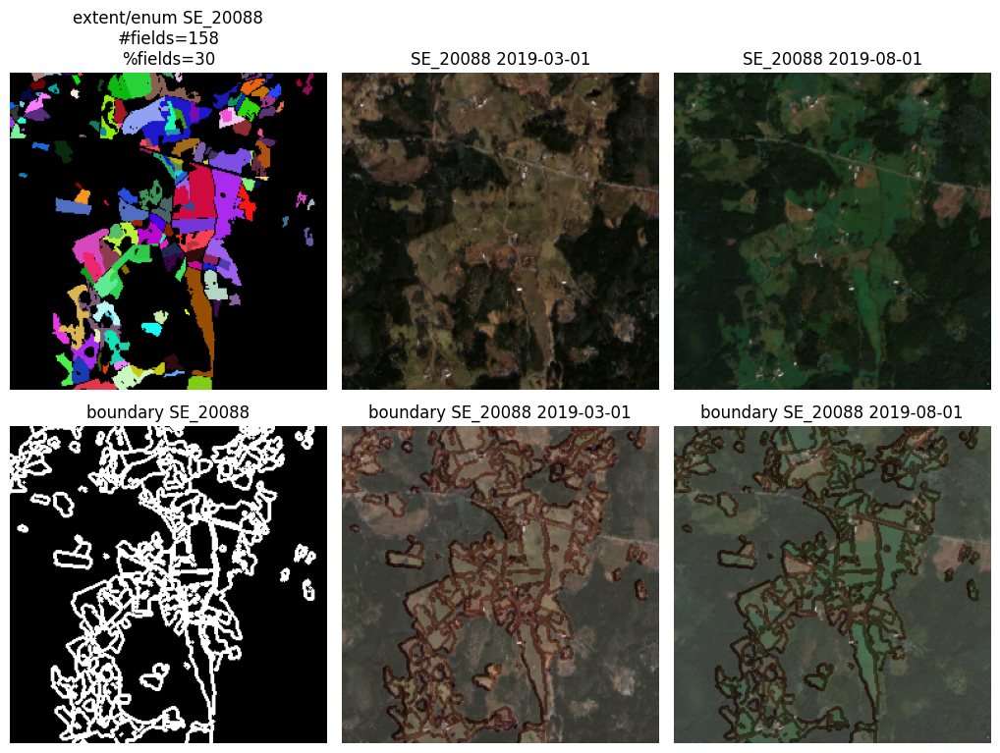

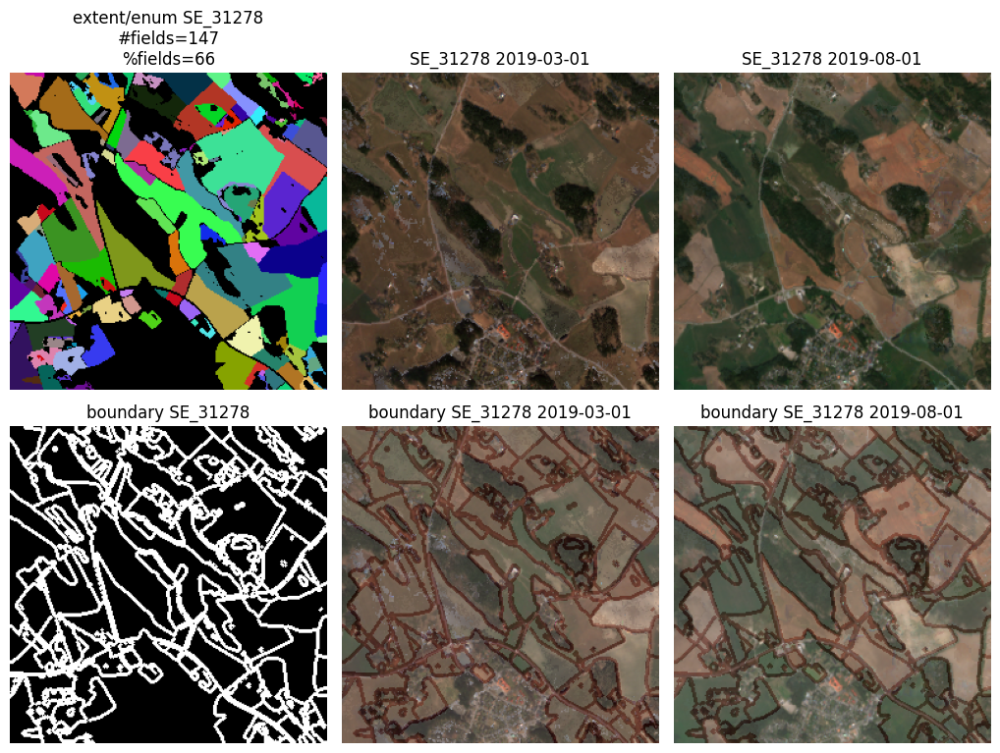

In [76]:
# visualze the patches with #field small area > 25
# Number of patches with sm_area_cnt (>= 25.87) of fields present 75 (5.28%)
visualize_col_data(data, SENTINEL2_DIR, country=country, col='sm_area_cnt_gt', num_img=2,
                       num_plots=2)

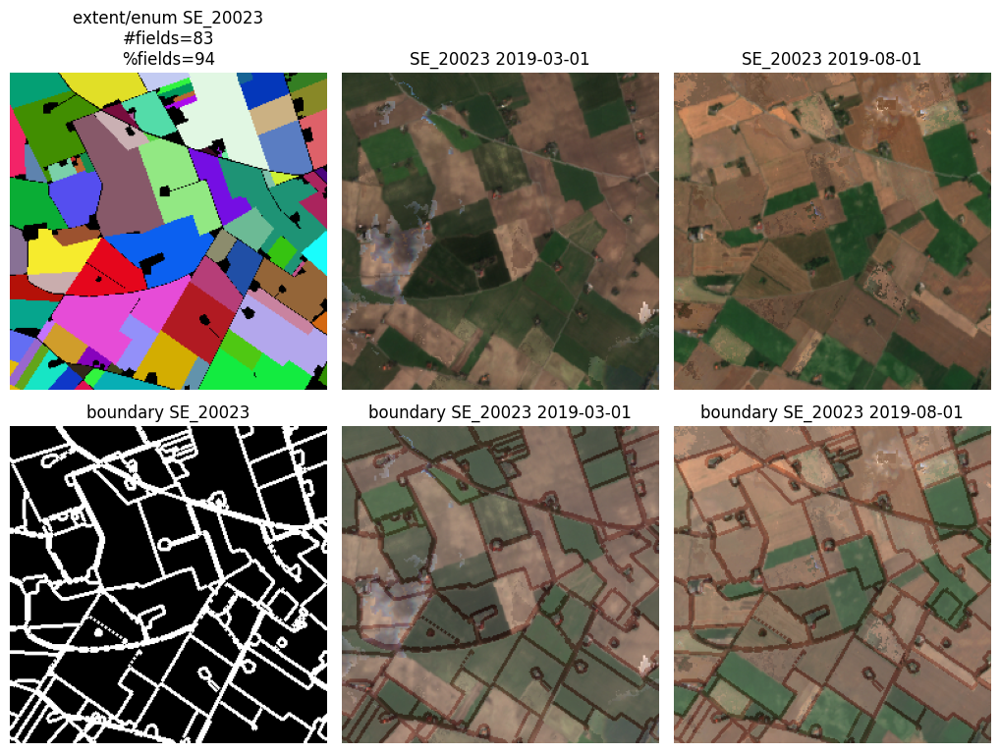

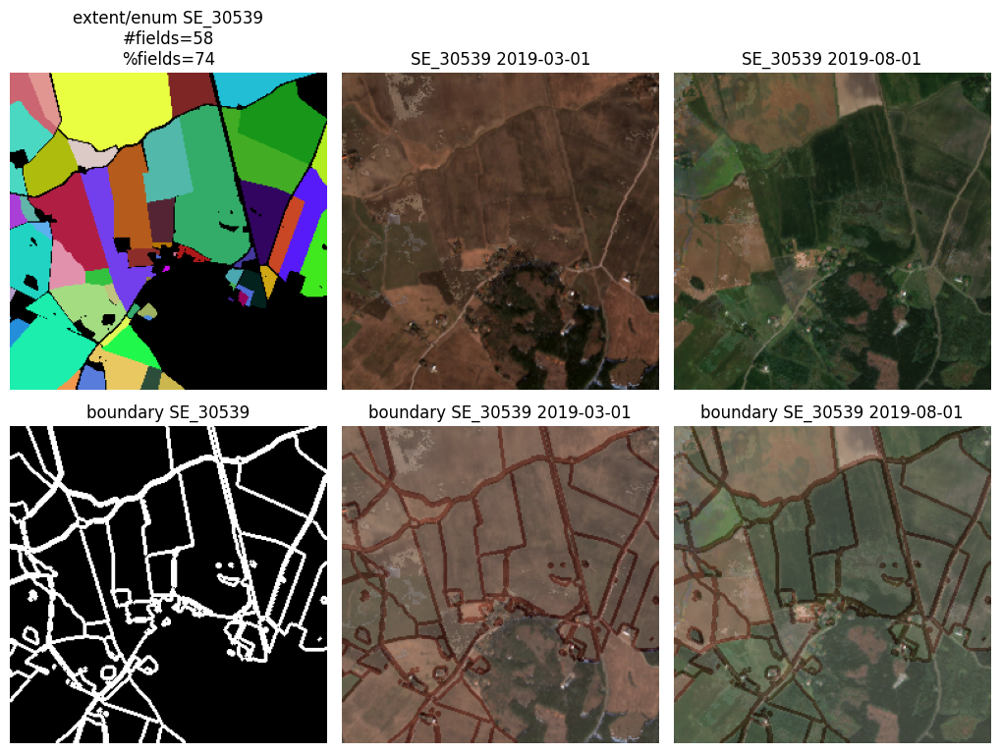

In [77]:
# visualze the patches with the following rool
# Number of patches with bg_area_cnt (>= 3.13) of fields present 58 (4.08%)
visualize_col_data(data, SENTINEL2_DIR, country=country, col='bg_area_cnt_gt', num_img=2,
                       num_plots=2)

In [ ]:
# visualze the patches with the following rool
# Number of patches with sm_solidity_cnt (>= 0.38) of fields present 39 (2.75%)
visualize_col_data(data, SENTINEL2_DIR, country=country, col='sm_solidity_cnt_gt', num_img=2,
                       num_plots=2) # no intereset (small with irregular border shape + big parcels in one scene) 

In [ ]:
# visualze the patches with the following rool
# Number of patches with bg_solidity_cnt (>= 108.86) of fields present 83 (5.85%)
visualize_col_data(data, SENTINEL2_DIR, country=country, col='bg_solidity_cnt_gt', num_img=2,
                       num_plots=1) # not much of interest -> rectangular shapes for parcels are prevailed here 

In [ ]:
# visualze the patches with the following rool
# Number of patches with sm_eccentricity_cnt (>= 1.66) of fields present 96 (6.76%)
visualize_col_data(data, SENTINEL2_DIR, country=country, col='sm_eccentricity_cnt_gt', num_img=2,
                       num_plots=1) # no interest here -> shapes are not so solid (not rect) - similar to vis 'sm_area_cnt_gt'

### Conclusion for the country (NL)

Missing gt fields (num_fields < 40):

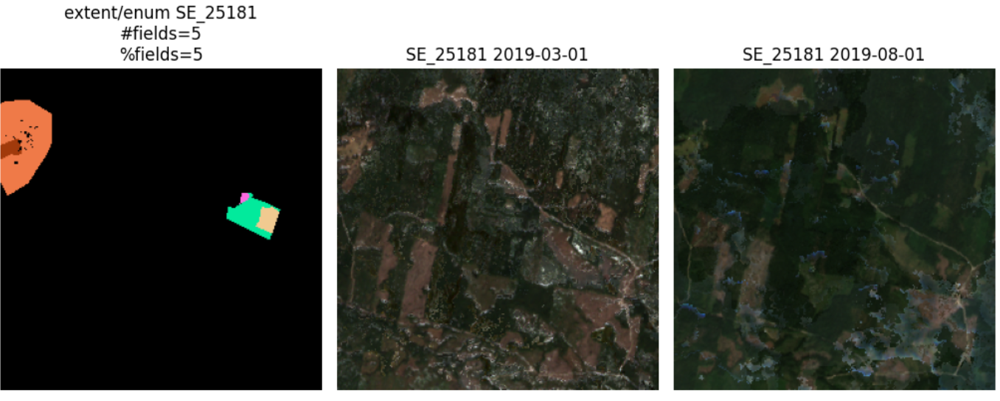

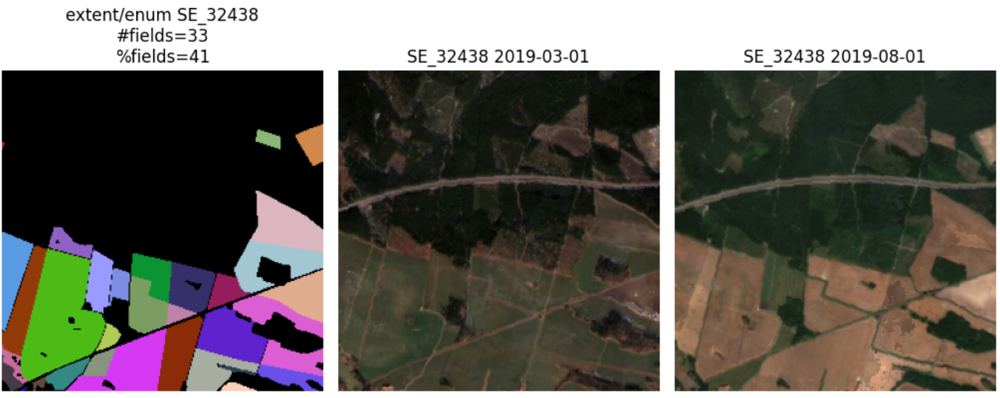

Unclear if it's field or not - greenary around maybe forest (num_fields < 40):
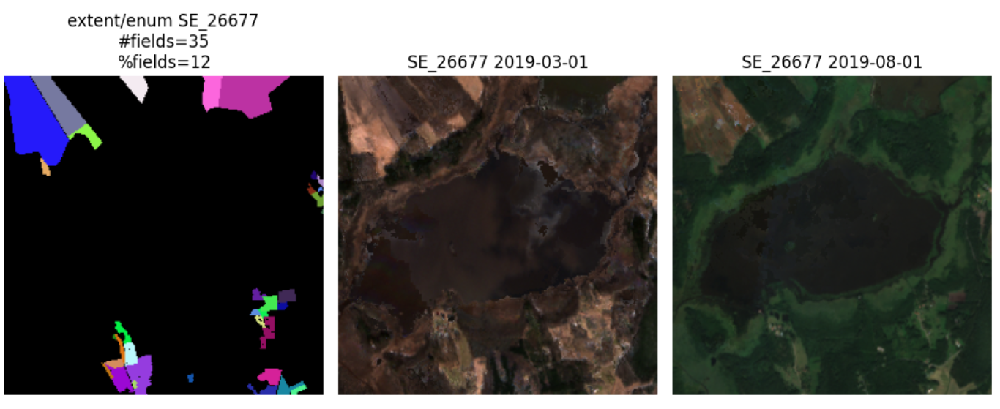

Unclear if it's field or not - greenary around maybe forest (many small fields - 'sm_area_cnt_gt')
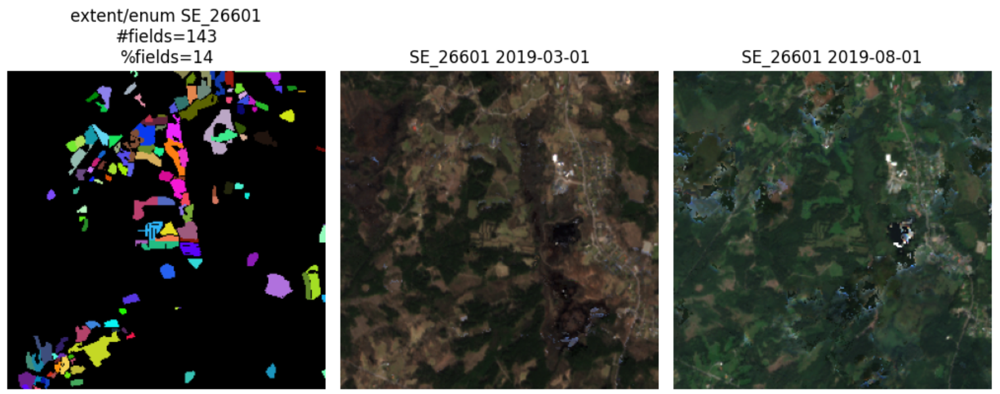

Cloud artifacts (prc_fields < 10%):
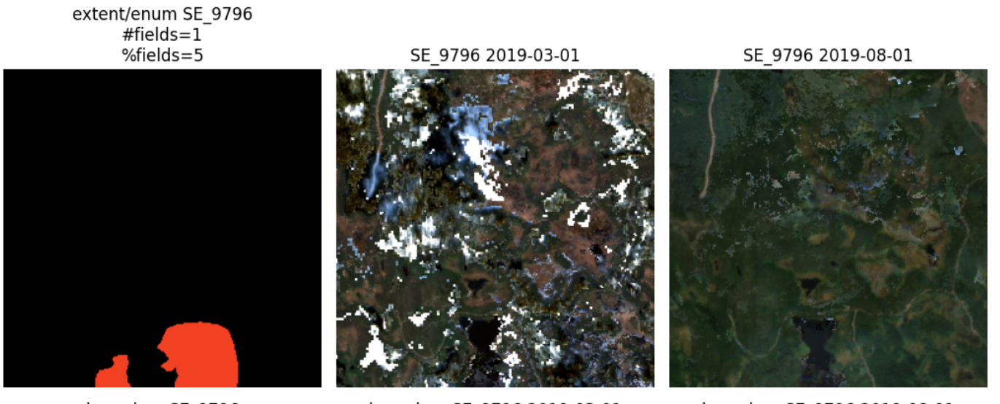

-> better delete prc_fields < 10% or num_fields < 40 data from training dataset.

March, April (not greenary visible yet):

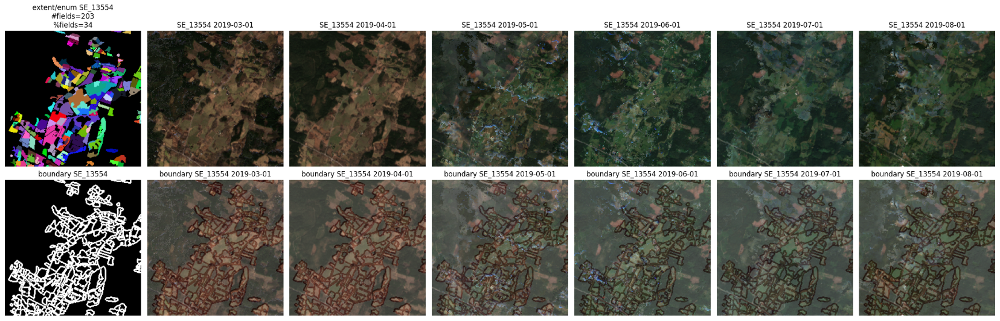

Oversegmentation (several sub-plots are planted during diff times in one cadastre):

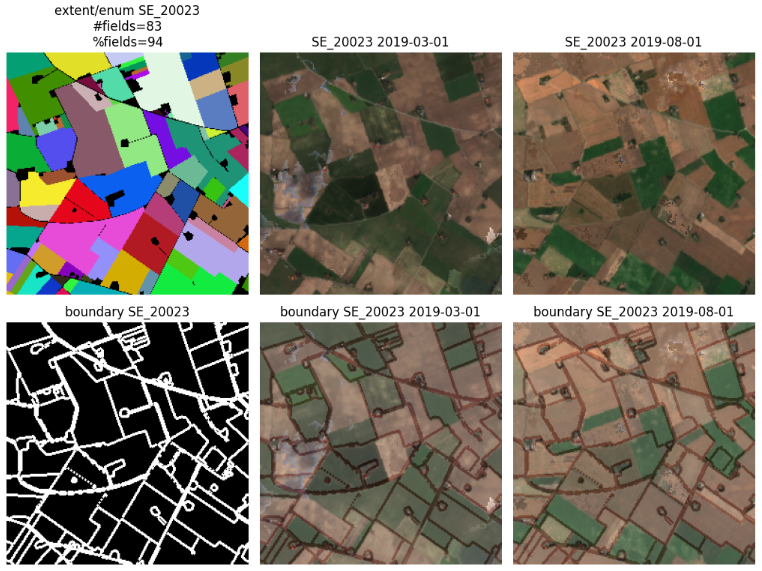

Based on eccentricity visualizations -> no circular fields

__TO BE DELETED__: (Number of patches without fields present 121 (8.52%)) +
(Number of patches with small number or small percentage of fields present combined 418 (29.44%)) -> ~40% delete for the training data (clouds artifacts, forest or other greenary, not clear if there shoud be a field a not).